<a href="https://colab.research.google.com/github/Nekoiii/instruments-simulation/blob/main/test_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
%%capture
!apt install libasound2-dev portaudio19-dev libportaudio2 libportaudiocpp0 ffmpeg
!pip install pyaudio

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import soundfile as sf
from scipy.fft import fft, fftfreq
from scipy.signal import find_peaks
import pyaudio
import wave
from IPython.display import Audio

In [6]:
real_piano_C4_path = "/content/drive/MyDrive/instruments-simulation/assets/audios/real_piano/C4.wav"
real_harp_C4_path = "/content/drive/MyDrive/instruments-simulation/assets/audios/real_harp/C4.mp3"
real_flute_C4_path = "/content/drive/MyDrive/instruments-simulation/assets/audios/real_flute/C4.wav"
simulated_piano_C4_path = "/content/simulated_piano_C4.wav"
simulated_harp_C4_path = "/content/simulated_harp_C4.wav"
simulated_flute_C4_path = "/content/simulated_flute_C4.wav"

In [7]:
display(Audio(real_piano_C4_path))
display(Audio(real_harp_C4_path))
display(Audio(real_flute_C4_path))

In [42]:
# Tool Functions
def initialize_plot(title="Title", xlabel="X", ylabel="Y", figsize=(10, 4)):
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.gca().xaxis.set_major_locator(MultipleLocator(500))
    plt.grid(True)

def plot_signal(x, y, title="Title", xlabel="X", ylabel="Y"):
    initialize_plot(title, xlabel, ylabel)
    plt.plot(x, y)
    plt.show()

def plot_multi_signals(data_pairs, title="Title"):
    num_plots = len(data_pairs)
    plt.figure(figsize=(5 * num_plots, 4))

    for i, (x, y, plot_title, xlabel, ylabel) in enumerate(data_pairs, start=1):
        plt.subplot(1, num_plots, i)
        plt.plot(x, y)
        plt.title(plot_title)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.grid(True)

    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

def plot_frequency_spectrum_with_harmonics(frequencies, spectrum, peak_freqs=None, peak_magnitudes=None,
                                           title="Frequency Spectrum with Harmonics", xlabel="Frequency (Hz)", ylabel="Magnitude", xlim=None):
    initialize_plot(title, xlabel, ylabel, figsize=(15, 4))
    plt.plot(frequencies, spectrum, label='Spectrum')
    if peak_freqs is not None and peak_magnitudes is not None:
        plt.plot(peak_freqs, peak_magnitudes, 'x', label='Harmonics')
    plt.legend()

    if xlim is not None:
      plt.xlim(xlim)

    plt.show()

# Analysis


Main frequencies:<br>
C4 = 261.63<br>
D4 = 293.66<br>
E4 = 329.63<br>
F4 = 349.23<br>
G4 = 392.00<br>
A4 = 440.00<br>
B4 = 493.88

---------- Piano C4 ----------
origin_fft:
 [-0.05545044-0.j          0.20413481+0.08875789j  0.41538886+0.1156603j
 ...  0.53601962-0.17996306j  0.41538886-0.1156603j
  0.20413481-0.08875789j]
origin_fft_abs:
 [0.05545044 0.22259601 0.43119045 ... 0.56542351 0.43119045 0.22259601]
spectrum_amplitudes:
 [0.05545044 0.22259601 0.43119045 ... 0.00415893 0.01235489 0.00902682]
np.max(spectrum_amplitudes):
 2759.402766184614
frequencies:
 [0.00000000e+00 1.11111111e-01 2.22222222e-01 ... 2.20496667e+04
 2.20497778e+04 2.20498889e+04]
np.max(frequencies): 22049.888888888887


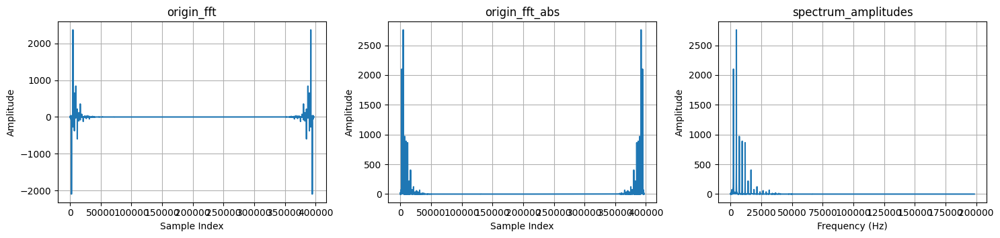

peak_indices: [ 2355  4661  4713  4779  7076  9446 11825 14216 16626]
peaks:
 [(261.66666666666663, 2100.354122259287), (517.8888888888889, 142.76597555356247), (523.6666666666666, 2759.402766184614), (531.0, 148.4347953142307), (786.2222222222222, 968.8628768549794), (1049.5555555555554, 888.4315054210066), (1313.888888888889, 863.8636775847955), (1579.5555555555554, 219.35241217475658), (1847.3333333333333, 403.53033183823794)]
---------- Harp C4 ----------
origin_fft:
 [0.19845262-0.j         0.26702112+0.01558557j 0.27927342-0.04626317j ...
 0.30218356+0.13943423j 0.27927342+0.04626317j 0.26702112-0.01558557j]
origin_fft_abs:
 [0.19845262 0.26747559 0.28307936 ... 0.33280146 0.28307936 0.26747559]
spectrum_amplitudes:
 [1.98452616e-01 2.67475585e-01 2.83079358e-01 ... 8.36612351e-06
 7.68751026e-06 7.40232820e-06]
np.max(spectrum_amplitudes):
 3262.434561604426
frequencies:
 [0.00000000e+00 1.85831311e-01 3.71662621e-01 ... 2.20494425e+04
 2.20496283e+04 2.20498142e+04]
np.max(freq

In [35]:
def get_frequency_recipe(file_path, show_plot=False):
  audio, sample_rate = sf.read(file_path)

  # If the audio is stereo, convert the signal to mono (by averaging across channels)
  if audio.ndim > 1:
      audio = audio.mean(axis=1)

  # Convert signal to frequency spectrum (using Fast Fourier Transform)
  N = len(audio)
  origin_fft = fft(audio)
  origin_fft_abs = np.abs(origin_fft)
  spectrum_amplitudes = origin_fft_abs[:N // 2]  # only take the positive part.
  frequencies = fftfreq(N, 1 / sample_rate)[:N // 2]

  print('\033[1morigin_fft:\n\033[0m', origin_fft)
  print('\033[1morigin_fft_abs:\n\033[0m',  origin_fft_abs)
  print('\033[1mspectrum_amplitudes:\n\033[0m',  spectrum_amplitudes)
  print('\033[1mnp.max(spectrum_amplitudes):\n\033[0m',  np.max(spectrum_amplitudes))
  print('\033[1mfrequencies:\n\033[0m',  frequencies)
  print('\033[1mnp.max(frequencies):\033[0m',  np.max(frequencies))

  if show_plot:
    plot_multi_signals([
        (range(len(origin_fft)), origin_fft, "origin_fft", "Sample Index", "Amplitude"),
        (range(len(origin_fft_abs)), origin_fft_abs, "origin_fft_abs", "Sample Index", "Amplitude"),
        (range(len(spectrum_amplitudes)), spectrum_amplitudes, "spectrum_amplitudes", "Frequency (Hz)", "Amplitude")
    ], title="")

  peak_indices, _ = find_peaks(spectrum_amplitudes, height=0.05 * max(spectrum_amplitudes.flatten()), distance=20)
  peaks = [(frequencies[p], spectrum_amplitudes[p]) for p in peak_indices]

  print('\033[1mpeak_indices:\033[0m',peak_indices)
  print('\033[1mpeaks:\n\033[0m',peaks)

  recipe = {'frequencies':frequencies, 'spectrum_amplitudes':spectrum_amplitudes, 'peaks':peaks, 'sample_rate':sample_rate}

  return recipe

print('-'*10,'\033[1mPiano C4\033[0m','-'*10)
paino_C4_recipe = get_frequency_recipe(real_piano_C4_path, show_plot=True)
# print('paino_C4_recipe:' ,paino_C4_recipe)
print('-'*10,'\033[1mHarp C4\033[0m','-'*10)
harp_C4_recipe = get_frequency_recipe(real_harp_C4_path)
print('-'*10,'\033[1mFlute C4\033[0m','-'*10)
flute_C4_recipe = get_frequency_recipe(real_flute_C4_path)

---------- Piano C4 ---------- 



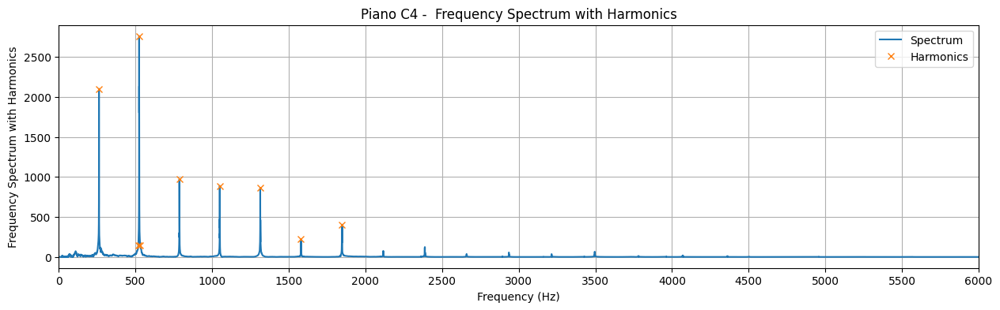

Harmonic 1: Frequency = 261.67 Hz, Amplitude = 2100.35
Harmonic 2: Frequency = 517.89 Hz, Amplitude = 142.77
Harmonic 3: Frequency = 523.67 Hz, Amplitude = 2759.40
Harmonic 4: Frequency = 531.00 Hz, Amplitude = 148.43
Harmonic 5: Frequency = 786.22 Hz, Amplitude = 968.86
Harmonic 6: Frequency = 1049.56 Hz, Amplitude = 888.43
Harmonic 7: Frequency = 1313.89 Hz, Amplitude = 863.86
Harmonic 8: Frequency = 1579.56 Hz, Amplitude = 219.35
Harmonic 9: Frequency = 1847.33 Hz, Amplitude = 403.53

 ---------- Harp C4 ---------- 



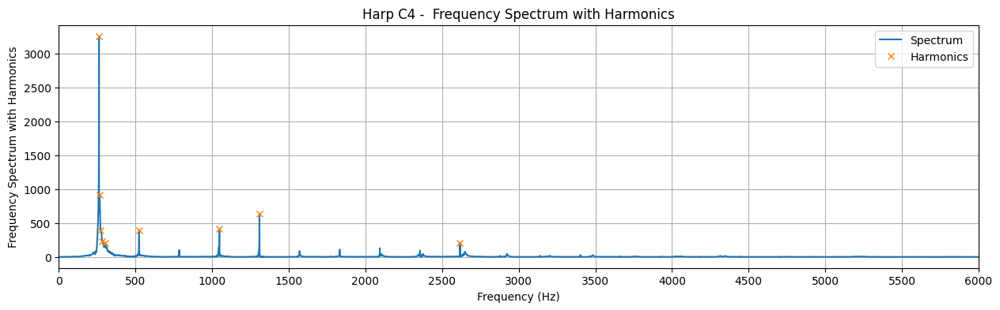

Harmonic 1: Frequency = 261.65 Hz, Amplitude = 3262.43
Harmonic 2: Frequency = 265.37 Hz, Amplitude = 921.75
Harmonic 3: Frequency = 272.80 Hz, Amplitude = 390.01
Harmonic 4: Frequency = 283.95 Hz, Amplitude = 231.68
Harmonic 5: Frequency = 303.83 Hz, Amplitude = 208.58
Harmonic 6: Frequency = 523.49 Hz, Amplitude = 398.15
Harmonic 7: Frequency = 1046.97 Hz, Amplitude = 417.75
Harmonic 8: Frequency = 1308.62 Hz, Amplitude = 634.87
Harmonic 9: Frequency = 2617.25 Hz, Amplitude = 211.71

 ---------- Flute C4 ---------- 



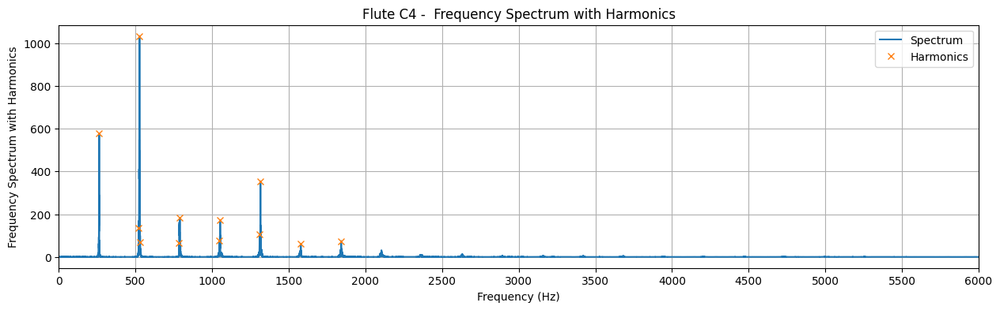

Harmonic 1: Frequency = 262.95 Hz, Amplitude = 578.78
Harmonic 2: Frequency = 521.56 Hz, Amplitude = 134.04
Harmonic 3: Frequency = 526.12 Hz, Amplitude = 1033.43
Harmonic 4: Frequency = 530.91 Hz, Amplitude = 68.41
Harmonic 5: Frequency = 784.74 Hz, Amplitude = 66.32
Harmonic 6: Frequency = 789.29 Hz, Amplitude = 182.07
Harmonic 7: Frequency = 1047.68 Hz, Amplitude = 76.54
Harmonic 8: Frequency = 1052.24 Hz, Amplitude = 171.23
Harmonic 9: Frequency = 1309.95 Hz, Amplitude = 104.62
Harmonic 10: Frequency = 1315.19 Hz, Amplitude = 354.21
Harmonic 11: Frequency = 1578.36 Hz, Amplitude = 60.09
Harmonic 12: Frequency = 1841.53 Hz, Amplitude = 74.53


In [43]:
def plot_frequency_spectrum_with_peaks(file_path, recipe, title_prefix="", xlim=None):
  frequencies = recipe['frequencies']
  spectrum_amplitudes = recipe['spectrum_amplitudes']
  peaks = recipe['peaks']
  peak_xs, peak_ys = zip(*peaks) if peaks else ([], [])

  display(Audio(file_path))

  plot_frequency_spectrum_with_harmonics(frequencies, spectrum_amplitudes, peak_xs, peak_ys, title=f"{title_prefix} Frequency Spectrum with Harmonics",
                                         xlabel="Frequency (Hz)", ylabel="Frequency Spectrum with Harmonics", xlim=xlim)

  # print('Frequency range:',  np.min(frequencies), '~', np.max(frequencies), 'Hz')
  # print('Amplitude range:',  np.min(spectrum_amplitudes), '~', np.max(spectrum_amplitudes))
  for i, (freq, mag) in enumerate(zip(peak_xs, peak_ys)):
      print(f"Harmonic {i+1}: Frequency = {freq:.2f} Hz, Amplitude = {mag:.2f}")

xlim=(0, 6000)
print('-'*10,'\033[1mPiano C4\033[0m','-'*10,'\n')
plot_frequency_spectrum_with_peaks(real_piano_C4_path, paino_C4_recipe, title_prefix="Piano C4 - ", xlim=xlim)
print('\n','-'*10,'\033[1mHarp C4\033[0m','-'*10,'\n')
plot_frequency_spectrum_with_peaks(real_harp_C4_path, harp_C4_recipe, title_prefix="Harp C4 - ", xlim=xlim)
print('\n','-'*10,'\033[1mFlute C4\033[0m','-'*10,'\n')
plot_frequency_spectrum_with_peaks(real_flute_C4_path, flute_C4_recipe, title_prefix="Flute C4 - ", xlim=xlim)


# Simulation

In [51]:
import numpy as np
from scipy.io.wavfile import write
from IPython.display import Audio, display

def synthesize_individual_tones(origin_autio_path, recipe, duration=2):
    sample_rate = recipe['sample_rate']
    peaks = recipe['peaks']

    # Create time array
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    synthesized_audio = np.zeros_like(t)

    for i, (freq, amp) in enumerate(peaks):
        # Create a single tone with specified frequency and amplitude
        tone = amp * np.sin(2 * np.pi * freq * t)

        tone_filename = f"tone_{i+1}_freq_{int(freq)}Hz.wav"
        write(tone_filename, sample_rate, (tone * 32767).astype(np.int16))
        print(f"Playing single tone: {freq:.2f} Hz")
        display(Audio(tone_filename, rate=sample_rate))

        synthesized_audio += tone

    synthesized_audio = synthesized_audio / np.max(np.abs(synthesized_audio))

    synthesized_filename = "synthesized_sound.wav"
    write(synthesized_filename, sample_rate, (synthesized_audio * 32767).astype(np.int16))
    print("Synthesized sound")
    display(Audio(synthesized_filename, rate=sample_rate))
    print("Origin sound")
    display(Audio(origin_autio_path, rate=sample_rate))

duration = 2
print('-'*10,'\033[1mPiano C4\033[0m','-'*10,'\n')
synthesize_individual_tones(real_piano_C4_path, paino_C4_recipe, duration)
print('\n','-'*10,'\033[1mHarp C4\033[0m','-'*10,'\n')
synthesize_individual_tones(real_harp_C4_path, harp_C4_recipe, duration)
print('\n','-'*10,'\033[1mFlute C4\033[0m','-'*10,'\n')
synthesize_individual_tones(real_flute_C4_path, flute_C4_recipe, duration)


---------- Piano C4 ---------- 

Playing single tone: 261.67 Hz


Playing single tone: 517.89 Hz


Playing single tone: 523.67 Hz


Playing single tone: 531.00 Hz


Playing single tone: 786.22 Hz


Playing single tone: 1049.56 Hz


Playing single tone: 1313.89 Hz


Playing single tone: 1579.56 Hz


Playing single tone: 1847.33 Hz


Synthesized sound


Origin sound



 ---------- Harp C4 ---------- 

Playing single tone: 261.65 Hz


Playing single tone: 265.37 Hz


Playing single tone: 272.80 Hz


Playing single tone: 283.95 Hz


Playing single tone: 303.83 Hz


Playing single tone: 523.49 Hz


Playing single tone: 1046.97 Hz


Playing single tone: 1308.62 Hz


Playing single tone: 2617.25 Hz


Synthesized sound


Origin sound



 ---------- Flute C4 ---------- 

Playing single tone: 262.95 Hz


Playing single tone: 521.56 Hz


Playing single tone: 526.12 Hz


Playing single tone: 530.91 Hz


Playing single tone: 784.74 Hz


Playing single tone: 789.29 Hz


Playing single tone: 1047.68 Hz


Playing single tone: 1052.24 Hz


Playing single tone: 1309.95 Hz


Playing single tone: 1315.19 Hz


Playing single tone: 1578.36 Hz


Playing single tone: 1841.53 Hz


Synthesized sound


Origin sound
